In [1]:
%matplotlib inline
from __future__ import division

import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

In [2]:
from datahub.products import Products
from datahub.catalog import Catalog

In [3]:
# 265: MED Overall changes waves mean rcp45 2081 2100
# 267: ATN Overall changes waves mean rcp45 2081 2100
# 269: MED Overall changes waves mean rcp45 2026 2045
# 271: ATN Overall changes waves mean rcp45 2026 2045
    
med_catalog_2081_85 = Catalog(Products().get(265))
med_catalog_2026_85 = Catalog(Products().get(269))

atn_catalog_2081_85 = Catalog(Products().get(267))
atn_catalog_2026_85 = Catalog(Products().get(271))

med_ds_2026_85 = med_catalog_2026_85.datasets[1].open_xarray_conn()
med_ds_2081_85 = med_catalog_2081_85.datasets[1].open_xarray_conn()

atn_ds_2026_85 = atn_catalog_2026_85.datasets[2].open_xarray_conn()
atn_ds_2081_85 = atn_catalog_2081_85.datasets[2].open_xarray_conn()


med = xr.concat([med_ds_2026_85, med_ds_2081_85], dim='time')
atn = xr.concat([atn_ds_2026_85, atn_ds_2081_85], dim='time')
atn_med = xr.merge([med, atn])
hs_mean = atn_med["diff_hs_mean"]

In [4]:
figsize = [16, 12]
dpi = 100
extent = [atn_med.longitude.min() -10,atn_med.longitude.max() + 10,atn_med.latitude.min() -10 ,atn_med.latitude.max() +10]
map_proj = ccrs.Mercator(min_latitude=20, max_latitude=65)

fig = plt.figure()
plt.rcParams['figure.figsize'] = figsize
plt.rcParams['figure.dpi'] = dpi

<Figure size 432x288 with 0 Axes>

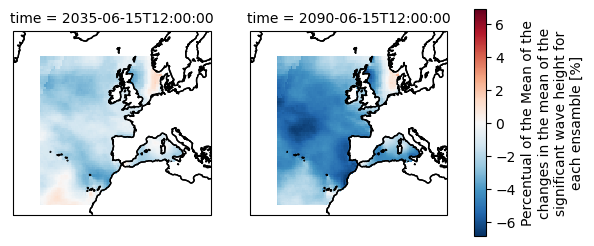

In [5]:
p = hs_mean.plot(transform=ccrs.PlateCarree(),  # the data's projection
             col='time', col_wrap=2,  # multiplot settings
             subplot_kws={'projection': map_proj})  # the plot's projection
for ax in p.axes.flat:
    ax.coastlines()
    ax.set_global()
    # ax.stock_img()
    ax.coastlines()

    ax.set_extent(extent)


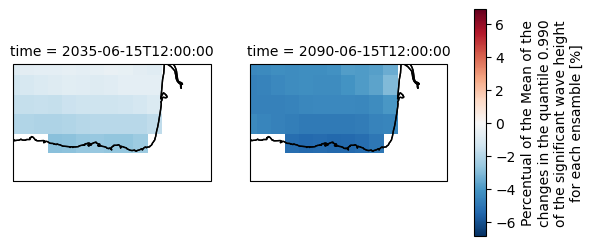

In [6]:
extent = [-6.5 ,0.5 ,42.5 ,45.5]


p = atn["diff_hs_mean"].plot(transform=ccrs.PlateCarree(),  # the data's projection
             col='time', col_wrap=2,  # multiplot settings
             subplot_kws={'projection': map_proj})  # the plot's projection
for ax in p.axes.flat:
    ax.coastlines()
    ax.set_global()
    # ax.stock_img()
    ax.coastlines()

    ax.set_extent(extent)